In [7]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from keras.utils import to_categorical
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
import os
import glob
import pathlib
import matplotlib.pyplot as plt
import splitfolders
from matplotlib import gridspec
import PIL

In [2]:
 tf.__version__

'2.3.1'

In [3]:
#!unzip -q All_Time_Artist.zip

In [5]:
!ls images

ls: cannot access 'images': No such file or directory


In [3]:
import os

#Images_Dir ='/Users/olaoluwa/Documents/PGD/PROJECTS/Machine Learning2/Data Used/images'
num_skipped = 0
Label= ["Albrecht_Dürer","Frida_Kahlo", "Pablo_Picasso", 
                    "Georges_Seurat", "Paul_Cezanne", "Alfred_Sisley", "Giotto_di_Bondone", 
                    "Paul_Gauguin", "Amedeo_Modigliani", "Gustav_Klimt", "Paul_Klee", "Andrei_Rublev", 
                    "Gustave_Courbet", "Peter_Paul_Rubens", "Andy_Warhol", "Henri_Matisse", 
                    "Pierre-Auguste_Renoir", "Camille_Pissarro", "Henri_Rousseau", "Piet_Mondrian", 
                    "Caravaggio", "Henri_de_Toulouse-Lautrec", "Pieter_Bruegel", "Claude_Monet", 
                    "Hieronymus_Bosch", "Raphael", "Diego_Rivera", "Jackson_Pollock", "Rembrandt", 
                    "Diego_Velazquez", "Jan_van_Eyck", "Rene_Magritte", "Edgar_Degas", "Joan_Miro", 
                    "Salvador_Dali", "Edouard_Manet", "Kazimir_Malevich", "Sandro_Botticelli", 
                    "Edvard_Munch", "Leonardo_da_Vinci", "Titian", "El_Greco", "Marc_Chagall", 
                    "Vasiliy_Kandinskiy", "Eugene_Delacroix", "Michelangelo", "Vincent_van_Gogh", 
                    "Francisco_Goya", "Mikhail_Vrubel", "William_Turner"]



len(Label)

50

# Counting the number of paintings for each artist

In [8]:
# Path to paintings directory 
paintings_path = "C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/individual"

#Extract artist names
artists_file_path = glob.glob(paintings_path + '/*.jpg')

len(artists_file_path)
artists_file_path

['C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/individual\\Albrecht_Dürer_1.jpg',
 'C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/individual\\Alfred_Sisley_1.jpg',
 'C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/individual\\Amedeo_Modigliani_1.jpg',
 'C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/individual\\Andrei_Rublev_1.jpg',
 'C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/individual\\Andy_Warhol_1.jpg',
 'C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/individual\\Camille_Pissarro_1.jpg',
 'C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/individual\\Caravaggio_1.jpg',
 'C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/individual\\Claude_Monet_1.jpg',
 'C:/Users/Home/Docum

# Extracting the name from the file path

In [10]:
def split_name2(input_path):
    list3 = []
    x = input_path
    #print(x)
    a = x.split("/")
    #print('a', a)
    b = a[8]
    #print('b', b)
    c = b.split("\\")
    #print('c',c)
    d = c[1]
    #print('d',d)
    e = d.split("_")
    #print('length of e',len(e))
    #print('e',e)

    if len(e) == 4:
        fname = e[0]
        #print(fname)
        lname = e[1]+"_"+e[2]
        #print(lname)

        list3.append(fname)
        list3.append(lname)
        #print(list3)
    elif len(e) == 3:
        fname = e[0]
        lname = e[1]
        list3.append(fname)
        list3.append(lname)
        #print(list3)
    else:
        lname = e[0]
        list3.append(lname)
        #print(list3)

    return list3

# Print out the extracted names

In [11]:
count = 0
for filename in artists_file_path:
    print(split_name2(filename))
    count +=1
#counts the number of artists
print(count)

['Albrecht', 'Dürer']
['Alfred', 'Sisley']
['Amedeo', 'Modigliani']
['Andrei', 'Rublev']
['Andy', 'Warhol']
['Camille', 'Pissarro']
['Caravaggio']
['Claude', 'Monet']
['Diego', 'Rivera']
['Diego', 'Velazquez']
['Edgar', 'Degas']
['Edouard', 'Manet']
['Edvard', 'Munch']
['El', 'Greco']
['Eugene', 'Delacroix']
['Francisco', 'Goya']
['Frida', 'Kahlo']
['Georges', 'Seurat']
['Giotto', 'di_Bondone']
['Gustave', 'Courbet']
['Gustav', 'Klimt']
['Henri', 'de_Toulouse-Lautrec']
['Henri', 'Matisse']
['Henri', 'Rousseau']
['Hieronymus', 'Bosch']
['Jackson', 'Pollock']
['Jan', 'van_Eyck']
['Joan', 'Miro']
['Kazimir', 'Malevich']
['Leonardo', 'da_Vinci']
['Marc', 'Chagall']
['Michelangelo']
['Mikhail', 'Vrubel']
['Pablo', 'Picasso']
['Paul', 'Cezanne']
['Paul', 'Gauguin']
['Paul', 'Klee']
['Peter', 'Paul_Rubens']
['Pierre-Auguste', 'Renoir']
['Pieter', 'Bruegel']
['Piet', 'Mondrian']
['Raphael']
['Rembrandt']
['Rene', 'Magritte']
['Salvador', 'Dali']
['Sandro', 'Botticelli']
['Titian']
['Vasiliy',

In [13]:
# Storing list of artist names
list_of_artists = []

for filename in artists_file_path:
    artist_name = ""
    artist_path = split_name2(filename)
    for item in artist_path:
        artist_name = artist_name + item + "_"
    list_of_artists.append(artist_name)

In [15]:
list_of_artists

['Albrecht_Dürer_',
 'Alfred_Sisley_',
 'Amedeo_Modigliani_',
 'Andrei_Rublev_',
 'Andy_Warhol_',
 'Camille_Pissarro_',
 'Caravaggio_',
 'Claude_Monet_',
 'Diego_Rivera_',
 'Diego_Velazquez_',
 'Edgar_Degas_',
 'Edouard_Manet_',
 'Edvard_Munch_',
 'El_Greco_',
 'Eugene_Delacroix_',
 'Francisco_Goya_',
 'Frida_Kahlo_',
 'Georges_Seurat_',
 'Giotto_di_Bondone_',
 'Gustave_Courbet_',
 'Gustav_Klimt_',
 'Henri_de_Toulouse-Lautrec_',
 'Henri_Matisse_',
 'Henri_Rousseau_',
 'Hieronymus_Bosch_',
 'Jackson_Pollock_',
 'Jan_van_Eyck_',
 'Joan_Miro_',
 'Kazimir_Malevich_',
 'Leonardo_da_Vinci_',
 'Marc_Chagall_',
 'Michelangelo_',
 'Mikhail_Vrubel_',
 'Pablo_Picasso_',
 'Paul_Cezanne_',
 'Paul_Gauguin_',
 'Paul_Klee_',
 'Peter_Paul_Rubens_',
 'Pierre-Auguste_Renoir_',
 'Pieter_Bruegel_',
 'Piet_Mondrian_',
 'Raphael_',
 'Rembrandt_',
 'Rene_Magritte_',
 'Salvador_Dali_',
 'Sandro_Botticelli_',
 'Titian_',
 'Vasiliy_Kandinskiy_',
 'Vincent_van_Gogh_',
 'William_Turner_']

# Use substring to remove _ from the end of the name

In [16]:
list_of_artists2 = []

for item in list_of_artists:
    list_of_artists2.append(item[0:-1])
    
list_of_artists2

['Albrecht_Dürer',
 'Alfred_Sisley',
 'Amedeo_Modigliani',
 'Andrei_Rublev',
 'Andy_Warhol',
 'Camille_Pissarro',
 'Caravaggio',
 'Claude_Monet',
 'Diego_Rivera',
 'Diego_Velazquez',
 'Edgar_Degas',
 'Edouard_Manet',
 'Edvard_Munch',
 'El_Greco',
 'Eugene_Delacroix',
 'Francisco_Goya',
 'Frida_Kahlo',
 'Georges_Seurat',
 'Giotto_di_Bondone',
 'Gustave_Courbet',
 'Gustav_Klimt',
 'Henri_de_Toulouse-Lautrec',
 'Henri_Matisse',
 'Henri_Rousseau',
 'Hieronymus_Bosch',
 'Jackson_Pollock',
 'Jan_van_Eyck',
 'Joan_Miro',
 'Kazimir_Malevich',
 'Leonardo_da_Vinci',
 'Marc_Chagall',
 'Michelangelo',
 'Mikhail_Vrubel',
 'Pablo_Picasso',
 'Paul_Cezanne',
 'Paul_Gauguin',
 'Paul_Klee',
 'Peter_Paul_Rubens',
 'Pierre-Auguste_Renoir',
 'Pieter_Bruegel',
 'Piet_Mondrian',
 'Raphael',
 'Rembrandt',
 'Rene_Magritte',
 'Salvador_Dali',
 'Sandro_Botticelli',
 'Titian',
 'Vasiliy_Kandinskiy',
 'Vincent_van_Gogh',
 'William_Turner']

# Counts the number of paintings in a directory

In [17]:
DATADIR = "C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/images/"
#Counts the number of paintings by Albrecht_Dürer
count = 0
for path in pathlib.Path(DATADIR+"Albrecht_Dürer").iterdir():
    if path.is_file():
        count += 1

print(count)

328


# A function to count the number of paintings in an artist directory

In [18]:
def count_files(directory):
    DATADIR = "C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/images/"
    count = 0
    for path in pathlib.Path(DATADIR+directory).iterdir():
        if path.is_file():
            count += 1
    return count

In [19]:
count_files(list_of_artists2[1])

259

# Loops through the list of artists and prints the number of paintings for each artist

In [21]:
sum = 0
count = 0
for name in list_of_artists2:
    print(name)
    print(count_files(name))
    sum = sum + count_files(name)
    count +=1

print('Total number of artists:',count)
print('Total number of paintings:',sum)

Albrecht_Dürer
328
Alfred_Sisley
259
Amedeo_Modigliani
193
Andrei_Rublev
99
Andy_Warhol
181
Camille_Pissarro
91
Caravaggio
55
Claude_Monet
73
Diego_Rivera
70
Diego_Velazquez
128
Edgar_Degas
703
Edouard_Manet
90
Edvard_Munch
67
El_Greco
87
Eugene_Delacroix
31
Francisco_Goya
291
Frida_Kahlo
120
Georges_Seurat
43
Giotto_di_Bondone
119
Gustave_Courbet
59
Gustav_Klimt
117
Henri_de_Toulouse-Lautrec
81
Henri_Matisse
186
Henri_Rousseau
70
Hieronymus_Bosch
137
Jackson_Pollock
24
Jan_van_Eyck
81
Joan_Miro
102
Kazimir_Malevich
126
Leonardo_da_Vinci
143
Marc_Chagall
239
Michelangelo
49
Mikhail_Vrubel
171
Pablo_Picasso
439
Paul_Cezanne
47
Paul_Gauguin
311
Paul_Klee
188
Peter_Paul_Rubens
141
Pierre-Auguste_Renoir
336
Pieter_Bruegel
134
Piet_Mondrian
84
Raphael
109
Rembrandt
262
Rene_Magritte
194
Salvador_Dali
139
Sandro_Botticelli
164
Titian
255
Vasiliy_Kandinskiy
88
Vincent_van_Gogh
877
William_Turner
66
Total number of artists: 50
Total number of paintings: 8447


In [22]:
TRAIN_DIR = "C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/images/"
print(TRAIN_DIR)
SPLIT_DIR = "C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/split2/"
print(SPLIT_DIR)

C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/images/


In [58]:
for folder_name in Label: 
    #print(folder_name)
    folder_path = os.path.join(TRAIN_DIR, folder_name)
    #print(folder_path)
    for fname in os.listdir(folder_path):
        #print(fname)
        fpath = os.path.join(folder_path, fname)
        try:
            fobj = open(fpath, "rb")
            is_jfif = tf.compat.as_bytes("JFIF") in fobj.peek(10)
        finally:
            fobj.close()

        if not is_jfif:
            num_skipped += 1
            #Delete corrupted image
           

print("delete %d images" % num_skipped)

delete 21832 images


In [4]:
Art=!ls images

Art

["ls: cannot access 'images': No such file or directory"]

In [59]:
Images = tf.keras.preprocessing.image_dataset_from_directory(TRAIN_DIR)

Found 8446 files belonging to 50 classes.


In [ ]:
splitfolders.ratio(TRAIN_DIR, output=SPLIT_DIR, seed=1337, ratio=(.6, .2, .2), group_prefix=None) # default values

In [27]:
#Path to training directory
TRAIN = "C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/split2/train"
#Path to validation directory
VAL = "C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/split2/val"
#Path to test dirctory
TEST = "C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/split2/test"

print(TRAIN)
print(VAL)
print(TEST)

C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/split2/train
C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/split2/val
C:/Users/Home/Documents/Semester 3/Data Mining & Machine Learning 2/Project/ArtImages/split2/test


In [25]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.applications import VGG16

In [41]:
batch_size = 36
input_shape = (224,224,3)

vgg = VGG16(input_shape = (224,224,3), 
            weights = 'imagenet', include_top = False)



train_ds=ImageDataGenerator(rescale=1./255.)
val_ds=ImageDataGenerator(rescale=1./255.)
test_ds=ImageDataGenerator(rescale=1./255.)

train_ds = ImageDataGenerator(
    validation_split =0.2,
    rescale=1./255,
    rotation_range=45,
    horizontal_flip=True,
    vertical_flip =True,
    
)

train_generator=train_ds.flow_from_directory(
    directory= TRAIN,
    batch_size=batch_size,
    seed=1337,
    shuffle=True,
    class_mode="categorical",
    target_size=input_shape[0:2]

    
)

valid_generator=val_ds.flow_from_directory(
    directory= VAL,
    batch_size=batch_size,
    seed=1337,
    shuffle=True,
    class_mode="categorical",
    target_size=input_shape[0:2]
)

test_generator=train_ds.flow_from_directory(
    directory= TEST,
    batch_size=1,
    seed=1234,
    shuffle=False,
    class_mode=None
)
STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size 
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size 
print("Total number of batches =", STEP_SIZE_TRAIN, "and", STEP_SIZE_VALID)



Found 5045 images belonging to 50 classes.
Found 1667 images belonging to 50 classes.
Found 1734 images belonging to 50 classes.
Total number of batches = 140 and 46


In [29]:
train_generator.class_indices

{'Albrecht_Dürer': 0,
 'Alfred_Sisley': 1,
 'Amedeo_Modigliani': 2,
 'Andrei_Rublev': 3,
 'Andy_Warhol': 4,
 'Camille_Pissarro': 5,
 'Caravaggio': 6,
 'Claude_Monet': 7,
 'Diego_Rivera': 8,
 'Diego_Velazquez': 9,
 'Edgar_Degas': 10,
 'Edouard_Manet': 11,
 'Edvard_Munch': 12,
 'El_Greco': 13,
 'Eugene_Delacroix': 14,
 'Francisco_Goya': 15,
 'Frida_Kahlo': 16,
 'Georges_Seurat': 17,
 'Giotto_di_Bondone': 18,
 'Gustav_Klimt': 19,
 'Gustave_Courbet': 20,
 'Henri_Matisse': 21,
 'Henri_Rousseau': 22,
 'Henri_de_Toulouse-Lautrec': 23,
 'Hieronymus_Bosch': 24,
 'Jackson_Pollock': 25,
 'Jan_van_Eyck': 26,
 'Joan_Miro': 27,
 'Kazimir_Malevich': 28,
 'Leonardo_da_Vinci': 29,
 'Marc_Chagall': 30,
 'Michelangelo': 31,
 'Mikhail_Vrubel': 32,
 'Pablo_Picasso': 33,
 'Paul_Cezanne': 34,
 'Paul_Gauguin': 35,
 'Paul_Klee': 36,
 'Peter_Paul_Rubens': 37,
 'Pierre-Auguste_Renoir': 38,
 'Piet_Mondrian': 39,
 'Pieter_Bruegel': 40,
 'Raphael': 41,
 'Rembrandt': 42,
 'Rene_Magritte': 43,
 'Salvador_Dali': 44,


# Visualize the data

A function to print artworks of a particular artist
artist_num is the number of the artist between 0 and 49
num_paintings must equal dim1*dim2

In [30]:
#artist_num is the number of the artist between 0 and 49
#If num_paintings must equal dim1*dim2
def print_artwork2(artist_num, num_paintings, dim1, dim2):
    #Picks an artist from the list of artists
    artist = Label[artist_num]
    print(artist)

    #gets all the images from the artists directory
    image = os.listdir(os.path.join(TRAIN_DIR, artist))
    #Prints all the painting from the artist directory
    #print(image)

    plt.figure(figsize=(30,40))
    for i in range(num_paintings):
        image_file0 = os.path.join(TRAIN_DIR, artist, image[i])
        image0 = plt.imread(image_file0)
        ax = plt.subplot(dim1,dim2,i+1)
        plt.imshow(image0)
        plt.title(Label[artist_num])
        plt.axis("off")

Pablo_Picasso


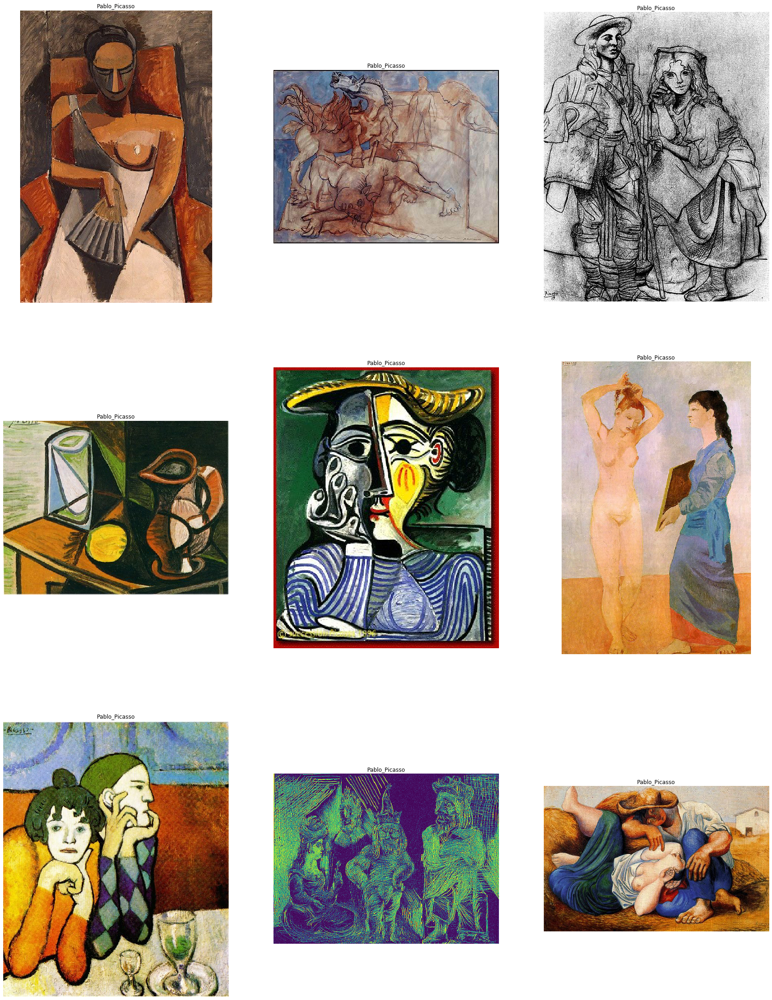

In [34]:
print_artwork2(2,9,3,3)

Here are the first 25 images in the training dataset. As you can see, label
In [14]:


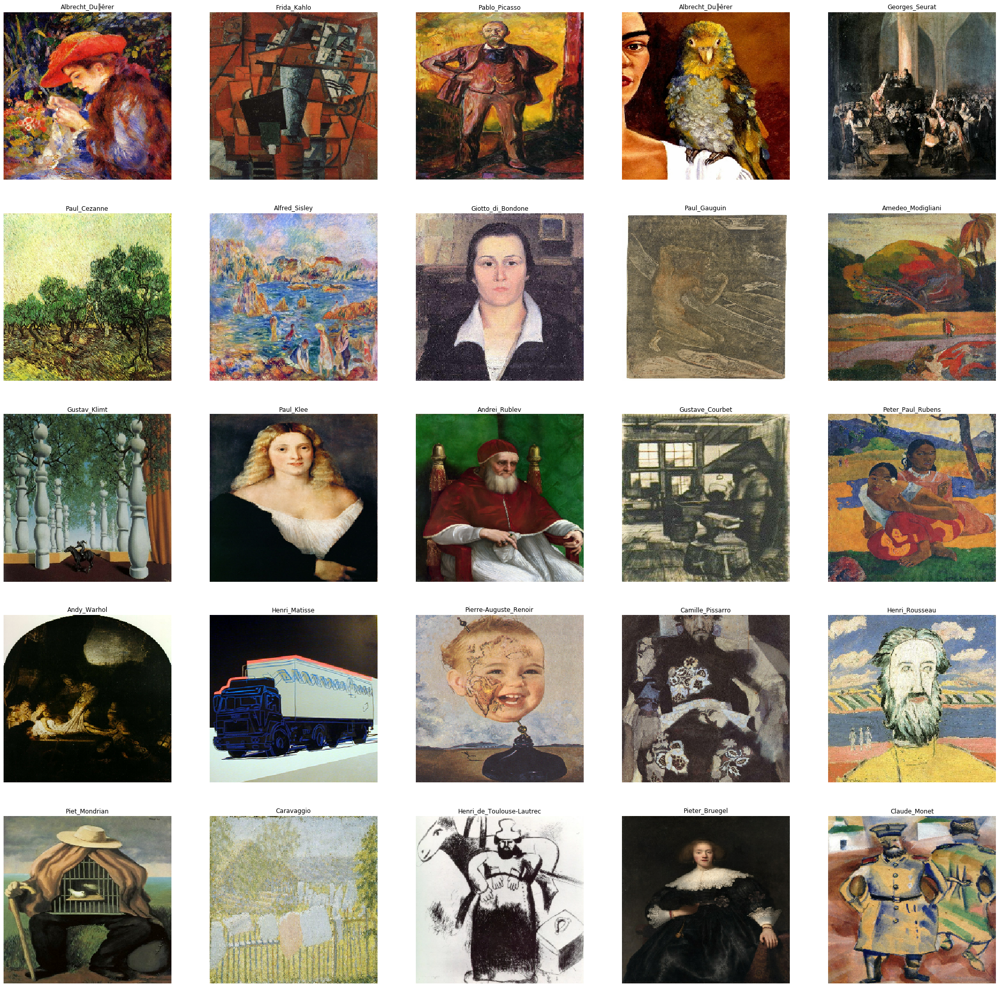

In [14]:
import matplotlib.pyplot as plt

plt.figure(figsize=(35,35))
for images, labels in Images.take(1):
    for i in range(25):
        ax = plt.subplot(5,5,i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(Label[i])
        plt.axis("off")

# Image augmentation

When you don't have a large image dataset, it's good practice to artificially introduce sample diversity by applying random yet realistic transformations to the training images such as random horizontal flipping or small random rotations. This helps expose the model to different aspects of the training data while slowing down overfitting

In [35]:
for image_batch, labels_batch in train_generator:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(36, 224, 224, 3)
(36, 50)


In [38]:
data_augmentation = keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.25),
    layers.experimental.preprocessing.RandomZoom(0.2), 
    layers.experimental.preprocessing.RandomTranslation(0.3,0.2), 
    layers.experimental.preprocessing.RandomContrast(0.2)
  ]
)

A function to print out augmented images. num_paintings must equal dim1*dim2.
image_num is the number of the image you want to augment

In [49]:
def print_artwork_augmentation(image_num,num_paintings, dim1, dim2):
    plt.figure(figsize=(22.4, 22.4))
    for images, _ in Images.take(1):
        for i in range(num_paintings):
            augmented_images = data_augmentation(images)
            ax = plt.subplot(dim1, dim2, i + 1)
            plt.imshow(augmented_images[image_num].numpy().astype("uint8"))
            plt.axis("off")

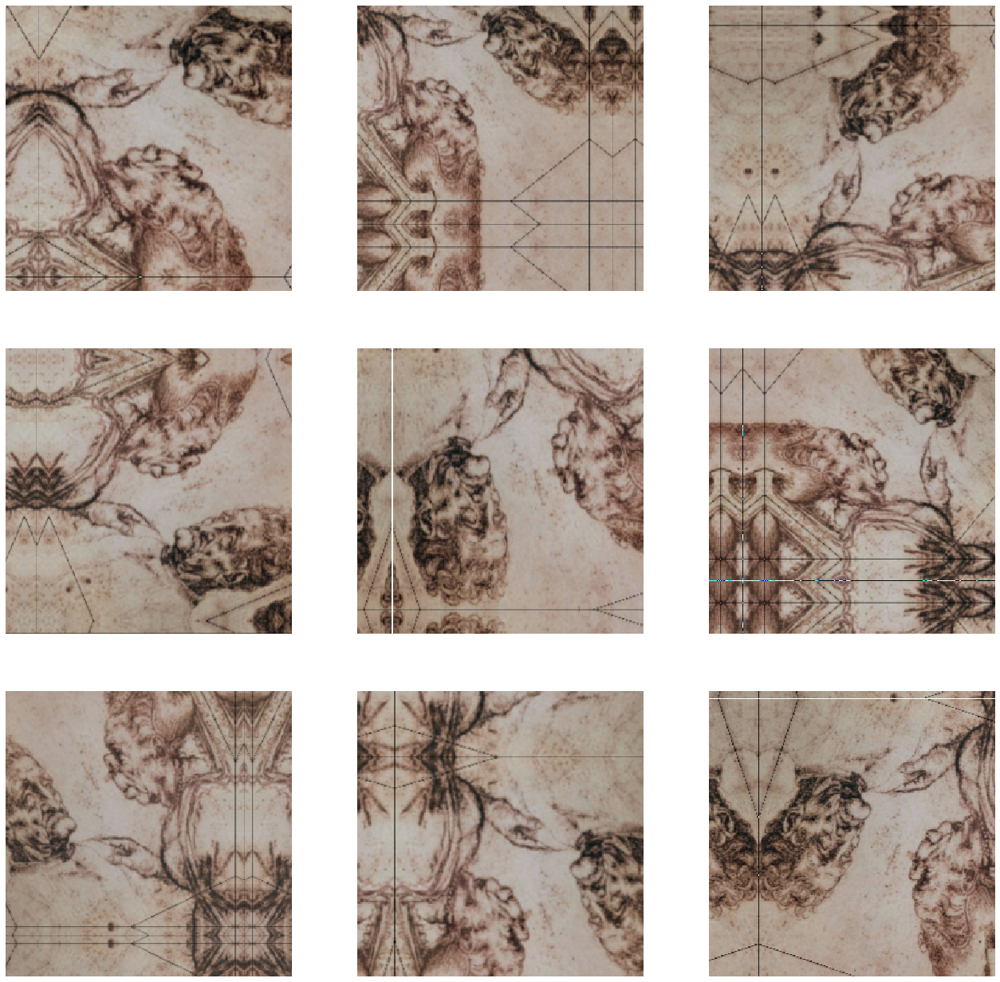

In [50]:
print_artwork_augmentation(0,9,3,3)

Let's visualize what the augmented samples look like, by applying data_augmentation repeatedly to the first image in the dataset:

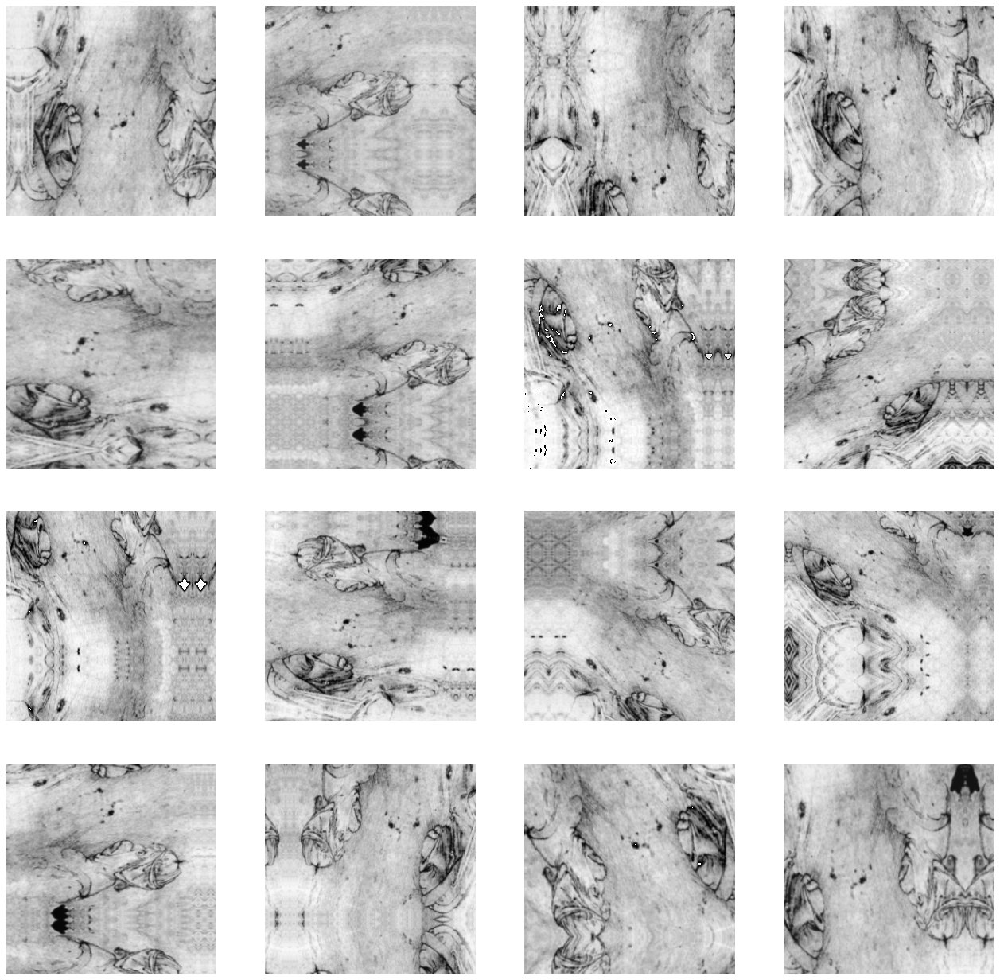

In [17]:
plt.figure(figsize=(22.4, 22.4))
for images, _ in Images.take(1):
    for i in range(16):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

In [60]:
normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

In [51]:
#https://www.kaggle.com/pankul/image-classification-w-vgg16-weights

# Can you explain this Ola?
num_classes=50
for layer in vgg.layers:
    layer.trainable = False

x = Flatten()(vgg.output)
x = Dense(num_classes, activation = 'softmax')(x)
model = Model(inputs = vgg.input, outputs = x)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy',"mean_squared_error"])

In [52]:
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)      

In [ ]:
epochs =20

history = model.fit_generator(train_generator, epochs=epochs, 
                              validation_data=valid_generator,)
print(history)

In [ ]:
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

# Plot history: MAE
plt.plot(history.history['loss'], label='MAE (training_data)')
plt.plot(history.history['val_loss'], label='MAE (validation_data)')
plt.title('MAE for Chennai Reservoir Levels')
plt.ylabel('MAE value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

In [ ]:
plt.plot(history.history['accuracy'], label='Training accuracy')
plt.plot(history.history['val_accuracy'], label='Validation accuracy')
plt.title('training / validation accuracies')
plt.ylabel('Accuracy')
plt.xlabel('No.Epoch')
plt.legend(loc="upper left")
plt.show()

In [ ]:
# Plot history: MSE
plt.plot(history.history['mean_squared_error'], label='MSE (training_data)')
plt.plot(history.history['val_mean_squared_error'], label='MSE (validation_data)')
plt.title('MSE for Chennai Reservoir Levels')
plt.ylabel('MSE value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

In [ ]:
# Plot history: Categorical crossentropy & Accuracy
plt.plot(history.history['loss'], label='Categorical crossentropy (training_data)')
plt.plot(history.history['val_loss'], label='Categorical crossentropy (validation_data)')
plt.plot(history.history['accuracy'], label='Accuracy (training_data)')
plt.plot(history.history['val_accuracy'], label='Accuracy (validation_data)')
plt.title('Model performance for 3D MNIST Keras Conv3D example')
plt.ylabel('Loss value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()


# Model evaluation